## Libraries

In [1]:
# Import packages

import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pyart
import glob
import matplotlib.patheffects as path_effects
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from pyproj import Transformer
import radlib
import os
import h5py
import matplotlib.dates as mdates
from scipy.ndimage import gaussian_filter1d
from cartopy.feature import NaturalEarthFeature
import xmltodict, geopandas, geojson, xml #xml and json do not exist
from datetime import datetime, timedelta
import geopy.distance
import numpy.matlib as npm
import copy
from scipy.signal import convolve2d
from astropy.convolution import convolve
import scipy.ndimage as ndi
import re
from skimage.draw import polygon
from pprint import pprint
from pysteps import io, motion, rcparams
from pysteps.utils import conversion, transformation
from pysteps.visualization import plot_precip_field, quiver
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import polars as pl
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import geopandas as gpd
from shapely.geometry import Point
from mpl_toolkits.mplot3d import Axes3D
from collections import Counter
import json
from collections import defaultdict

import shapefile




## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119

Pysteps configuration file found at: /scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pysteps/pystepsrc



In [2]:
# GPSConverter for coordinate transformation
class GPSConverter(object):
    '''
    GPS Converter class which is able to perform convertions between the 
    CH1903 and WGS84 system.
    '''
    # Convert CH y/x/h to WGS height
    def CHtoWGSheight(self, y, x, h):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        h = (h + 49.55) - (12.60 * y_aux) - (22.64 * x_aux)
        return h

    # Convert CH y/x to WGS lat
    def CHtoWGSlat(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lat = (16.9023892 + (3.238272 * x_aux)) + \
                - (0.270978 * pow(y_aux, 2)) + \
                - (0.002528 * pow(x_aux, 2)) + \
                - (0.0447 * pow(y_aux, 2) * x_aux) + \
                - (0.0140 * pow(x_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lat = (lat * 100) / 36
        return lat

    # Convert CH y/x to WGS long
    def CHtoWGSlng(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lng = (2.6779094 + (4.728982 * y_aux) + \
                + (0.791484 * y_aux * x_aux) + \
                + (0.1306 * y_aux * pow(x_aux, 2))) + \
                - (0.0436 * pow(y_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lng = (lng * 100) / 36
        return lng

    # Convert decimal angle (° dec) to sexagesimal angle (dd.mmss,ss)
    def DecToSexAngle(self, dec):
        degree = int(math.floor(dec))
        minute = int(math.floor((dec - degree) * 60))
        second = (((dec - degree) * 60) - minute) * 60
        return degree + (float(minute) / 100) + (second / 10000)
		
    # Convert sexagesimal angle (dd.mmss,ss) to seconds
    def SexAngleToSeconds(self, dms):
        degree = 0 
        minute = 0 
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return second + (minute * 60) + (degree * 3600)

    # Convert sexagesimal angle (dd.mmss) to decimal angle (degrees)
    def SexToDecAngle(self, dms):
        degree = 0
        minute = 0
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return degree + (minute / 60) + (second / 3600)
    
    # Convert WGS lat/long (° dec) and height to CH h
    def WGStoCHh(self, lat, lng, h):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        h = (h - 49.55) + (2.73 * lng_aux) + (6.94 * lat_aux)
        return h

    # Convert WGS lat/long (° dec) to CH x
    def WGStoCHx(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        x = ((200147.07 + (308807.95 * lat_aux) + \
            + (3745.25 * pow(lng_aux, 2)) + \
            + (76.63 * pow(lat_aux,2))) + \
            - (194.56 * pow(lng_aux, 2) * lat_aux)) + \
            + (119.79 * pow(lat_aux, 3))
        return x

	# Convert WGS lat/long (° dec) to CH y
    def WGStoCHy(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        y = (600072.37 + (211455.93 * lng_aux)) + \
            - (10938.51 * lng_aux * lat_aux) + \
            - (0.36 * lng_aux * pow(lat_aux, 2)) + \
            - (44.54 * pow(lng_aux, 3))
        return y

    def LV03toWGS84(self, east, north, height):
        '''
        Convert LV03 to WGS84 Return a array of double that contain lat, long,
        and height
        '''
        d = []
        d.append(self.CHtoWGSlat(east, north))
        d.append(self.CHtoWGSlng(east, north))
        d.append(self.CHtoWGSheight(east, north, height))
        return d
        
    def WGS84toLV03(self, latitude, longitude, ellHeight):
        '''
        Convert WGS84 to LV03 Return an array of double that contaign east,
        north, and height
        '''
        d = []
        d.append(self.WGStoCHy(latitude, longitude))
        d.append(self.WGStoCHx(latitude, longitude))
        d.append(self.WGStoCHh(latitude, longitude, ellHeight))
        return d
        
if __name__ == "__main__":
    ''' Example usage for the GPSConverter class.'''

    converter = GPSConverter()

    # Coordinates
    wgs84 = []
    lv03  = [567719, 155077, 1974]
    #567719/ 155077  Altitude: 1974
    # Convert WGS84 to LV03 coordinates
    wgs84 = converter.LV03toWGS84(lv03[0], lv03[1], lv03[2])

    print("WGS84: ")
    print(wgs84)
    print("LV03: ")
    print(lv03)


# c_transform
def c_transform(lon,lat):
    """
    transforms arrays of lat/lon to chx/chy

    Parameters
    ----------
    lon : float
        longitude.
    lat : float
        latitude.

    Returns
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.

    """
    converter = GPSConverter()
    chx=np.zeros([len(lon)])
    chy=np.zeros([len(lon)])
    for n in range(len(lon)):
        chx[n],chy[n],z=converter.WGS84toLV03(lat[n], lon[n], 0)
    return chx,chy

# transform_c 
def transform_c(chx,chy):
    """
    transforms arrays of chx/chy to lat/lon
    
    Parameters
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.
        
    Returns
    ----------
    lon : float
        longitude.
    lat : float
        latitude.



    """
    converter = GPSConverter()
    lon=np.zeros([len(chx)])
    lat=np.zeros([len(chy)])
    for n in range(len(lon)):
        lat[n], lon[n],z=converter.LV03toWGS84(chx[n],chy[n], 0)
    return lon,lat

WGS84: 
[46.54620053012867, 7.017760746224894, 2024.97379732]
LV03: 
[567719, 155077, 1974]


## Assimilation of Station Data

In [5]:
import pandas as pd
import re

# Define the file path
file_path = '/users/fackerma/newproject1/stations_readme.csv'

# Read the CSV file with adjusted parameters
df = pd.read_csv(file_path, sep='\t', header=None, names=['ID', 'Station', 'Coordinates'])

# Function to split the Station column
def split_station(row):
    if isinstance(row['Station'], str):
        # Use regex to split the string
        match = re.match(r'(.*?)\s+(\d+)\s+(m a\.s\.l\.)', row['Station'])
        if match:
            return pd.Series({
                'Station': match.group(1).strip(),
                'Altitude': int(match.group(2))  # Convert to integer
            })
    return pd.Series({'Station': row['Station'], 'Altitude': None})

# Apply the function to split the Station column
df[['Station', 'Altitude']] = df.apply(split_station, axis=1)

# Reorder the columns
df = df[['ID', 'Station', 'Altitude', 'Coordinates']]

# Remove the last 8 rows (metadata)
df = df.iloc[:-8]

# Filter the DataFrame for altitudes above 1500 meters
high_altitude_df = df[df['Altitude'] > 1500]

# Sort the DataFrame by altitude in descending order (optional)
high_altitude_df = high_altitude_df.sort_values('Altitude', ascending=False)

# Reset the index of the new DataFrame
high_altitude_df = high_altitude_df.reset_index(drop=True)

# Display the result
print(high_altitude_df)

# Optional: Display the number of stations above 1800 meters
print(f"\nNumber of stations above 1500 meters: {len(high_altitude_df)}")


        ID                  Station  Altitude     Coordinates
0       33             Jungfraujoch    3571.0  641939/ 155288
1       74            Piz Corvatsch    3294.0  783155/ 143525
2      866               Gornergrat    3129.0  626900/  92512
3      273                   Titlis    3045.0  675413/ 180411
4      856           Les Diablerets    2964.0  581914/ 130622
5      867                Eggishorn    2892.0  650279/ 141897
6      864              Les Attelas    2734.0  586855/ 105302
7       73            Weissfluhjoch    2691.0  780615/ 189634
8      862            Piz Martegnas    2668.0  760261/ 160570
9       35                   S�ntis    2501.0  744187/ 234921
10      62  Col du Grand St-Bernard    2472.0  579192/  79754
11     847              Crap Masegn    2468.0  732824/ 189378
12     863       Naluns / Schlivera    2380.0  815374/ 188987
13      60        Götsch, Andermatt    2286.0  690050/ 167475
14      23        Passo del Bernina    2260.0  798422/ 143020
15     4

In [6]:
import polars as pl
import pandas as pd

# Scan the parquet files
df = pl.scan_parquet('/scratch/mch/fackerma/orders/station_data/0_raw/data/**/*.parquet', hive_partitioning=True)

# Filter for 'fkl010z1' parameter only
df_filtered = df.filter(pl.col('param_short') == 'fkl010z1')

# Collect the filtered data
df_eager = df_filtered.collect()

# Filter for wind gust > 25 and < 61, and datetime between 2019 and 2023
df_filtered = df_eager.filter(
    (pl.col('value') >= 25) &
    (pl.col('value') < 61) &
    (pl.col('datetime').dt.year() >= 2019) &
    (pl.col('datetime').dt.year() <= 2023)
).sort('value', descending=True)

# Convert the Polars DataFrame to a Pandas DataFrame
df_pandas = df_filtered.to_pandas()

# Create the new DataFrame with the desired structure
new_df = pd.DataFrame({
    'Location/Station ID': df_pandas['station_id'],
    'Time': pd.to_datetime(df_pandas['datetime']).dt.round('5min'),
    'Longitude': df_pandas['longitude'],
    'Latitude': df_pandas['latitude'],
    'Attribute': df_pandas['value']
})

# Convert 'Time' to datetime64[ns]
new_df['Time'] = new_df['Time'].dt.tz_localize(None).astype('datetime64[ns]')

# Convert 'Attribute' and 'Location/Station ID' to object
new_df['Attribute'] = new_df['Attribute'].astype('object')
new_df['Location/Station ID'] = new_df['Location/Station ID'].astype('object')
new_df['Source'] = 'STA'

# Display the first few rows and basic information about the new DataFrame
print(new_df.head())
print("\nDataFrame Info:")
print(new_df.info())

# Verify the number of rows
print(f"\nNumber of rows in the DataFrame: {len(new_df)}")


  Location/Station ID                Time  Longitude   Latitude Attribute  \
0             20366.0 2020-02-05 12:00:00   7.876931  45.927214      60.9   
1             10862.0 2019-09-18 04:50:00  10.628603  46.502903      60.5   
2                65.0 2023-07-24 09:30:00   6.792331  47.083017      60.4   
3             10850.0 2019-11-29 07:30:00  10.796608  46.770303      59.7   
4             20366.0 2020-02-05 09:00:00   7.876931  45.927214      59.6   

  Source  
0    STA  
1    STA  
2    STA  
3    STA  
4    STA  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126777 entries, 0 to 126776
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Location/Station ID  126777 non-null  object        
 1   Time                 126777 non-null  datetime64[ns]
 2   Longitude            126777 non-null  float64       
 3   Latitude             126777 non-null  float64    

In [7]:
# Convert 'Location/Station ID' in new_df to integer
new_df['Location/Station ID'] = new_df['Location/Station ID'].astype(float).astype(int)

# Convert 'ID' in high_altitude_df to integer (if not already)
high_altitude_df['ID'] = high_altitude_df['ID'].astype(int)

# Get the list of IDs to remove
ids_to_remove = high_altitude_df['ID'].tolist()

# Remove rows from new_df where 'Location/Station ID' is in ids_to_remove
filtered_df = new_df[~new_df['Location/Station ID'].isin(ids_to_remove)]

# Reset the index of the filtered DataFrame
filtered_df = filtered_df.reset_index(drop=True)

# Convert 'Location/Station ID' to object (string) type
filtered_df['Location/Station ID'] = filtered_df['Location/Station ID'].astype(str)

# Print the number of rows removed and remaining
rows_removed = len(new_df) - len(filtered_df)
print(f"Number of rows removed: {rows_removed}")
print(f"Number of rows remaining: {len(filtered_df)}")

# Display the first few rows of the filtered DataFrame
print(filtered_df.head())
print("\nDataFrame Info:")
print(filtered_df.info())

filtered_df_new = filtered_df.copy()

Number of rows removed: 68446
Number of rows remaining: 58331
  Location/Station ID                Time  Longitude   Latitude Attribute  \
0               20366 2020-02-05 12:00:00   7.876931  45.927214      60.9   
1               10862 2019-09-18 04:50:00  10.628603  46.502903      60.5   
2                  65 2023-07-24 09:30:00   6.792331  47.083017      60.4   
3               10850 2019-11-29 07:30:00  10.796608  46.770303      59.7   
4               20366 2020-02-05 09:00:00   7.876931  45.927214      59.6   

  Source  
0    STA  
1    STA  
2    STA  
3    STA  
4    STA  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58331 entries, 0 to 58330
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Location/Station ID  58331 non-null  object        
 1   Time                 58331 non-null  datetime64[ns]
 2   Longitude            58331 non-null  float64       

In [8]:
import geopandas as gpd
from shapely.geometry import Point

# Read the Alps polygon shapefile
alps_gdf = gpd.read_file('alps_domain_def.shp')

# Assuming the Alps polygon is the 1st shape (adjust if needed)
alps_polygon = alps_gdf.iloc[1:2]

# Convert filtered_df to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    filtered_df_new, 
    geometry=gpd.points_from_xy(filtered_df_new.Longitude, filtered_df_new.Latitude),
    crs="EPSG:4326"
)

# Ensure both GeoDataFrames have the same CRS
gdf = gdf.to_crs(alps_polygon.crs)
alps_polygon = alps_polygon.to_crs(gdf.crs)

# Find points that are NOT within the Alps polygon
stations_outside_alps = gdf[~gdf.geometry.within(alps_polygon.geometry.iloc[0])]

# Find points that are within the Alps polygon
stations_in_alps = gdf[gdf.geometry.within(alps_polygon.geometry.iloc[0])]

# Convert back to a regular DataFrame if needed
stations_outside_alps = stations_outside_alps.drop(columns=['geometry'])

# Reset the index
stations_outside_alps = stations_outside_alps.reset_index(drop=True)

# Print the number of rows removed and remaining
rows_removed = len(filtered_df_new) - len(stations_outside_alps)
print(f"Number of rows removed (stations in Alps): {rows_removed}")
print(f"Number of rows remaining: {len(stations_outside_alps)}")
print(f"Number of rows removed: {len(stations_in_alps)}")

# Display the first few rows of the filtered DataFrame
print(stations_outside_alps.head())
print("\nDataFrame Info:")
print(stations_outside_alps.info())

filtered_df = stations_outside_alps.copy()
print(len(filtered_df))

Number of rows removed (stations in Alps): 23077
Number of rows remaining: 35254
Number of rows removed: 23077
  Location/Station ID                Time  Longitude   Latitude Attribute  \
0                  65 2023-07-24 09:30:00   6.792331  47.083017      60.4   
1               10839 2022-09-01 06:00:00  12.099169  47.036597      59.1   
2               10811 2022-09-01 01:30:00  11.931522  46.804297      59.0   
3               19959 2022-04-11 15:00:00   8.618672  45.909911      57.0   
4               10805 2022-08-29 00:50:00  12.116639  46.870394      56.0   

  Source  
0    STA  
1    STA  
2    STA  
3    STA  
4    STA  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35254 entries, 0 to 35253
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Location/Station ID  35254 non-null  object        
 1   Time                 35254 non-null  datetime64[ns]
 2   Lo

In [9]:
import geopandas as gpd
from shapely.geometry import Point

# Read the Switzerland with buffer shapefile
switzerland_buffer = gpd.read_file('switzerland_with_buffer.shp')

# Convert filtered_df to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    filtered_df, 
    geometry=gpd.points_from_xy(filtered_df.Longitude, filtered_df.Latitude),
    crs="EPSG:4326"
)

# Ensure both GeoDataFrames have the same CRS
switzerland_buffer = switzerland_buffer.to_crs("EPSG:4326")
gdf = gdf.to_crs("EPSG:4326")

# Find points that are within the Switzerland buffer
stations_in_buffer = gdf[gdf.geometry.within(switzerland_buffer.geometry.iloc[1])]  # Using the buffer geometry

# Convert back to a regular DataFrame if needed
filtered_df = stations_in_buffer.drop(columns=['geometry'])

# Reset the index
filtered_df = filtered_df.reset_index(drop=True)

# Print the number of rows removed and remaining
rows_removed = len(gdf) - len(filtered_df)
print(f"Number of rows removed (stations outside buffer): {rows_removed}")
print(f"Number of rows remaining: {len(filtered_df)}")

# Display the first few rows of the filtered DataFrame
print(filtered_df.head())
print("\nDataFrame Info:")
print(filtered_df.info())

print(len(filtered_df))

# Save the filtered DataFrame if needed


Number of rows removed (stations outside buffer): 27701
Number of rows remaining: 7553
  Location/Station ID                Time  Longitude   Latitude Attribute  \
0                  65 2023-07-24 09:30:00   6.792331  47.083017      60.4   
1               19959 2022-04-11 15:00:00   8.618672  45.909911      57.0   
2               10427 2019-09-19 02:30:00   9.085492  45.719006      55.6   
3               10427 2020-06-11 02:10:00   9.085492  45.719006      55.6   
4               10427 2020-06-13 05:10:00   9.085492  45.719006      55.6   

  Source  
0    STA  
1    STA  
2    STA  
3    STA  
4    STA  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7553 entries, 0 to 7552
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Location/Station ID  7553 non-null   object        
 1   Time                 7553 non-null   datetime64[ns]
 2   Longitude            7553 no

<Axes: >

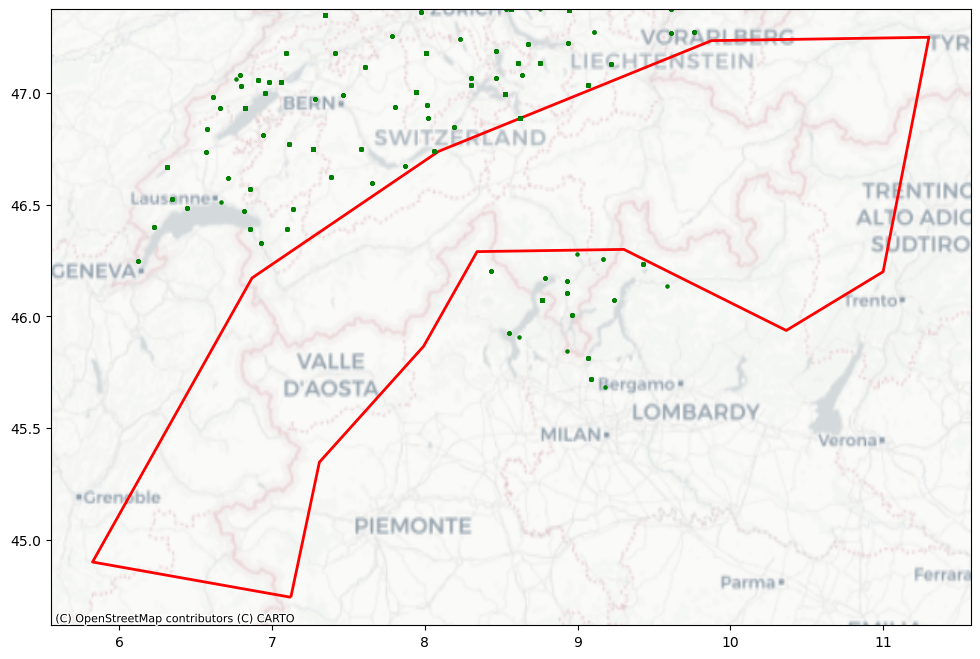

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

import geopandas as gpd
from shapely.geometry import Point

# Read the Alps polygon shapefile
alps_gdf = gpd.read_file('alps_domain_def.shp')

# Assuming the Alps polygon is the 7th shape (adjust if needed)
alps_polygon = alps_gdf.iloc[1:2]

# Convert filtered_df to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    filtered_df, 
    geometry=gpd.points_from_xy(filtered_df.Longitude, filtered_df.Latitude),
    crs="EPSG:4326"
)

# Ensure both GeoDataFrames have the same CRS
gdf = gdf.to_crs(alps_polygon.crs)
alps_polygon = alps_polygon.to_crs(gdf.crs)

# Find points that are NOT within the Alps polygon
stations_outside_alps = gdf[~gdf.geometry.within(alps_polygon.geometry.iloc[0])]

# Find points that are within the Alps polygon
stations_in_alps = gdf[gdf.geometry.within(alps_polygon.geometry.iloc[0])]



# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Alps polygon
alps_polygon.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)

# Add the CartoDB Positron basemap
ctx.add_basemap(ax, crs=alps_polygon.crs.to_string(), source=ctx.providers.CartoDB.Positron)


# Plot stations outside Alps in green
stations_outside_alps.plot(ax=ax, color='green', markersize=5)

# Plot stations inside Alps in red
#stations_in_alps.plot(ax=ax, color='red', markersize=5)


Original CRS: COMPD_CS["CH1903+ / LV95 + LN02 height",PROJCS["CH1903+ / LV95",GEOGCS["CH1903+",DATUM["CH1903+",SPHEROID["Bessel 1841",6377397.155,299.1528128,AUTHORITY["EPSG","7004"]],AUTHORITY["EPSG","6150"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4150"]],PROJECTION["Hotine_Oblique_Mercator_Azimuth_Center"],PARAMETER["latitude_of_center",46.9524055555556],PARAMETER["longitude_of_center",7.43958333333333],PARAMETER["azimuth",90],PARAMETER["rectified_grid_angle",90],PARAMETER["scale_factor",1],PARAMETER["false_easting",2600000],PARAMETER["false_northing",1200000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","2056"]],VERT_CS["LN02 height",VERT_DATUM["Landesnivellement 1902",2005,AUTHORITY["EPSG","5127"]],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Gravity-related height",UP],AUTHORITY["EPSG","5728"]]]
Shapefile saved as 'switzerland_with_buffer.

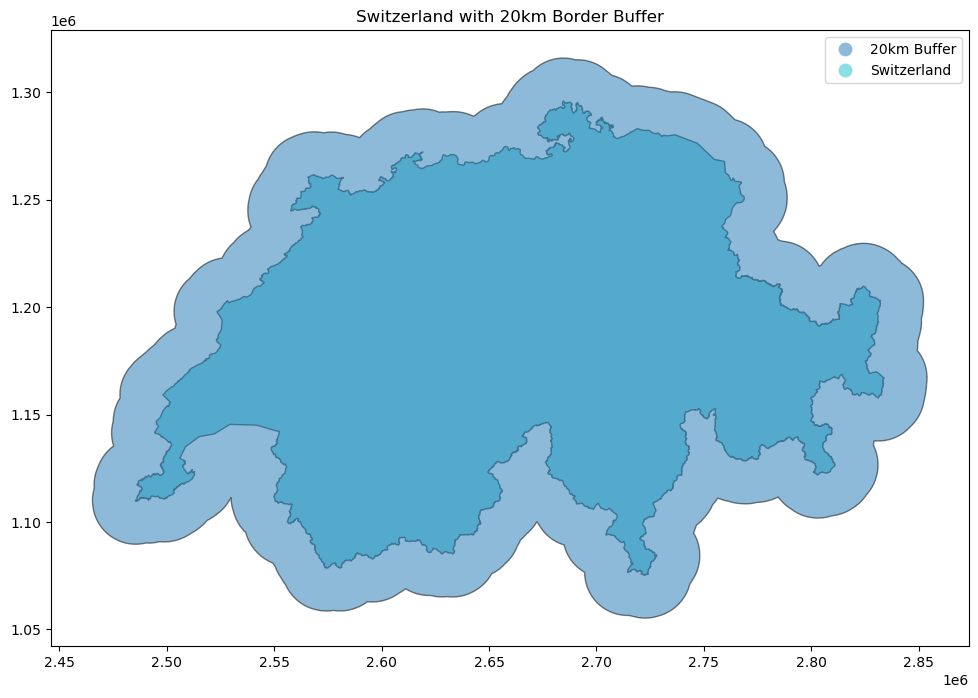

In [11]:
# Create Switzerland with a 25 km buffer
import geopandas as gpd
import matplotlib.pyplot as plt

# Read the shapefile
switzerland = gpd.read_file("swissBOUNDARIES3D_1_5_TLM_LANDESGEBIET.shp")

print(f"Original CRS: {switzerland.crs}")

# Create a 25 km buffer (assuming the CRS is already in meters)
buffer_20km = switzerland.geometry.buffer(20000)

# Create final GeoDataFrame with both geometries
result_gdf = gpd.GeoDataFrame({
    'name': ['Switzerland', '20km Buffer'],
    'geometry': [switzerland.geometry.union_all(), buffer_20km.union_all()]
}, crs=switzerland.crs)

# Save the result to a new shapefile
result_gdf.to_file("switzerland_with_buffer.shp")

print("Shapefile saved as 'switzerland_with_buffer.shp'")

# Attempt to visualize (this might still fail due to projection issues)
try:
    fig, ax = plt.subplots(figsize=(12, 8))
    result_gdf.plot(ax=ax, alpha=0.5, edgecolor='black', column='name', legend=True)
    plt.title('Switzerland with 20km Border Buffer')
    plt.show()
except ValueError as e:
    print(f"Visualization failed: {e}")
    print("The shapefile has been saved and can be viewed in a GIS software.")


## Assimilation of Crowd-Sourcing Data

In [15]:
# Combine the .json files 2021 to 2023 into one file, convert to datetime filter for the wind conditions
def convert_timestamp(ms):
    return datetime.utcfromtimestamp(ms / 1000)

# Define the wind conditions
wind_conditions = ['WIND_STURM', 'WIND_STARK', 'WIND_STUERMISCH', 'WIND_ORKAN']

# List of file paths
file_paths = [
    '/scratch/mch/fackerma/orders/CS/met_crowd_meldungen_2021.json',
    '/scratch/mch/fackerma/orders/CS/met_crowd_meldungen_2022.json',
    '/scratch/mch/fackerma/orders/CS/met_crowd_meldungen_2023.json'
]

all_filtered_features = []

# Process each file
for file_path in file_paths:
    # Load the JSON file
    with open(file_path, 'r') as file:
        data = json.load(file)

    features = data['features']

    # Filter the features
    for feature in features:
        props = feature['properties']
        date = convert_timestamp(props['timestamp']).date()
        if props['category'] == 'WIND' and props['auspraegung'] in wind_conditions:
            all_filtered_features.append(feature)

# Print results
print(f"Total number of matching reports: {len(all_filtered_features)}")

# Print details of each matching report
for feature in all_filtered_features:
    props = feature['properties']
    timestamp = convert_timestamp(props['timestamp'])
    print(f"\nTime: {timestamp.strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Location: {props['place']}")
    print(f"Wind condition: {props['auspraegung']}")
    print(f"Coordinates: {feature['geometry']['coordinates']}")

# Save the filtered features to a new JSON file
output_file = 'wind_reports_2021_2023.json'
with open(output_file, 'w') as f:
    json.dump(all_filtered_features, f, indent=2)
print(f"\nFiltered reports saved to {output_file}")


/tmp/ipykernel_255513/4229043572.py:3: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  return datetime.utcfromtimestamp(ms / 1000)


Total number of matching reports: 65470

Time: 2021-10-08 13:15:05
Location: Hinwil
Wind condition: WIND_STURM
Coordinates: [8.845, 47.3]

Time: 2021-10-08 13:18:02
Location: None
Wind condition: WIND_STARK
Coordinates: [8.85, 47.28]

Time: 2021-10-08 13:37:20
Location: Dürnten
Wind condition: WIND_STUERMISCH
Coordinates: [8.84, 47.28]

Time: 2021-10-08 13:50:05
Location: Dürnten
Wind condition: WIND_STARK
Coordinates: [8.84, 47.28]

Time: 2021-10-08 13:50:10
Location: Dürnten
Wind condition: WIND_STUERMISCH
Coordinates: [8.84, 47.28]

Time: 2021-10-08 13:50:15
Location: Dürnten
Wind condition: WIND_STURM
Coordinates: [8.84, 47.28]

Time: 2021-10-08 13:50:20
Location: Dürnten
Wind condition: WIND_ORKAN
Coordinates: [8.84, 47.28]

Time: 2021-10-13 09:23:49
Location: Thun
Wind condition: WIND_STARK
Coordinates: [7.625, 46.755]

Time: 2021-10-19 13:12:58
Location: Seewen SZ
Wind condition: WIND_ORKAN
Coordinates: [8.63, 47.03]

Time: 2021-10-27 09:45:00
Location: Burgdorf
Wind condition: 

In [16]:
# Store as dataframe with time norming: +2 hours, 5 min interval
import json
import pandas as pd

# Load the JSON file
with open('wind_reports_2021_2023.json', 'r') as file:
    data = json.load(file)

# Create the DataFrame
df = pd.DataFrame([
    {
        'Location/Station ID': feature['properties']['place'],
        'Time': feature['properties']['timestamp'],
        'Longitude': feature['geometry']['coordinates'][0],
        'Latitude': feature['geometry']['coordinates'][1],
        'Attribute': feature['properties']['auspraegung']
    }
    for feature in data
])

# Convert 'Time' column to datetime, subtract 2 hours, and round to nearest 5 minutes
df['Time'] = pd.to_datetime(df['Time'], unit='ms')
df['Time'] = df['Time'] + pd.Timedelta(hours=2)
df['Source'] = 'CS'



# Read the Alps polygon shapefile
alps_gdf = gpd.read_file('alps_domain_def.shp')

# Assuming the Alps polygon is the 1st shape (adjust if needed)
alps_polygon = alps_gdf['geometry'].iloc[1]

# Create a function to check if a point is within the Alps polygon
def is_within_alps(lon, lat, alps_polygon):
    point = Point(lon, lat)
    return alps_polygon.contains(point)

# Apply the function to create a boolean mask
mask = df.apply(lambda row: is_within_alps(row['Longitude'], row['Latitude'], alps_polygon), axis=1)

# Filter out the rows that are within the Alps polygon
df = df[~mask]

# Display the first few rows and basic information about the DataFrame
print(df.head())
print("\nDataFrame Info:")
print(df.info())

  Location/Station ID                    Time  Longitude  Latitude  \
0              Hinwil 2021-10-08 15:15:05.978      8.845     47.30   
1                None 2021-10-08 15:18:02.068      8.850     47.28   
2             Dürnten 2021-10-08 15:37:20.579      8.840     47.28   
3             Dürnten 2021-10-08 15:50:05.162      8.840     47.28   
4             Dürnten 2021-10-08 15:50:10.225      8.840     47.28   

         Attribute Source  
0       WIND_STURM     CS  
1       WIND_STARK     CS  
2  WIND_STUERMISCH     CS  
3       WIND_STARK     CS  
4  WIND_STUERMISCH     CS  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
Index: 59952 entries, 0 to 65469
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Location/Station ID  59612 non-null  object        
 1   Time                 59952 non-null  datetime64[ns]
 2   Longitude            59952 non-null  float64       
 3   L

In [ ]:
# Backup code
# Store as dataframe with time norming: +2 hours, 5 min interval
import json
import pandas as pd

# Load the JSON file
with open('wind_reports_2021_2023.json', 'r') as file:
    data = json.load(file)

# Create the DataFrame
df = pd.DataFrame([
    {
        'Location/Station ID': feature['properties']['place'],
        'Time': feature['properties']['timestamp'],
        'Longitude': feature['geometry']['coordinates'][0],
        'Latitude': feature['geometry']['coordinates'][1],
        'Attribute': feature['properties']['auspraegung']
    }
    for feature in data
])

# Convert 'Time' column to datetime, subtract 2 hours, and round to nearest 5 minutes
df['Time'] = pd.to_datetime(df['Time'], unit='ms')
df['Time'] = df['Time'] + pd.Timedelta(hours=2)
df['Source'] = 'CS'




# Display the first few rows and basic information about the DataFrame
print(df.head())
print("\nDataFrame Info:")
print(df.info())
print(len(df))

  Location/Station ID                    Time  Longitude  Latitude  \
0              Hinwil 2021-10-08 15:15:05.978      8.845     47.30   
1                None 2021-10-08 15:18:02.068      8.850     47.28   
2             Dürnten 2021-10-08 15:37:20.579      8.840     47.28   
3             Dürnten 2021-10-08 15:50:05.162      8.840     47.28   
4             Dürnten 2021-10-08 15:50:10.225      8.840     47.28   

         Attribute Source  
0       WIND_STURM     CS  
1       WIND_STARK     CS  
2  WIND_STUERMISCH     CS  
3       WIND_STARK     CS  
4  WIND_STUERMISCH     CS  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65470 entries, 0 to 65469
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Location/Station ID  65128 non-null  object        
 1   Time                 65470 non-null  datetime64[ns]
 2   Longitude            65470 non-null  float64       
 

## Merging CS and STA Dataframes

In [17]:
# Merge and get rid of null-values in lat and lon
merged_df = pd.concat([df, filtered_df], ignore_index=True)

# Find the index of the row where latitude or longitude is null
null_index = merged_df[merged_df['Latitude'].isnull() | merged_df['Longitude'].isnull()].index

# Delete the row
merged_df = merged_df.drop(null_index)

# Reset the index
merged_df = merged_df.reset_index(drop=True)

In [21]:
print(merged_df.info)

<bound method DataFrame.info of       Location/Station ID                    Time  Longitude   Latitude  \
0                  Hinwil 2021-10-08 15:15:05.978   8.845000  47.300000   
1                    None 2021-10-08 15:18:02.068   8.850000  47.280000   
2                 Dürnten 2021-10-08 15:37:20.579   8.840000  47.280000   
3                 Dürnten 2021-10-08 15:50:05.162   8.840000  47.280000   
4                 Dürnten 2021-10-08 15:50:10.225   8.840000  47.280000   
...                   ...                     ...        ...        ...   
67500               10421 2023-02-04 05:30:00.000   9.426661  46.236092   
67501               19981 2023-10-31 04:20:00.000   8.768814  46.071822   
67502               10887 2023-11-17 00:00:00.000   6.824578  46.935417   
67503               10887 2023-11-17 01:50:00.000   6.824578  46.935417   
67504               10889 2023-11-16 18:50:00.000   6.794044  47.032814   

             Attribute Source  
0           WIND_STURM     CS  
1  

In [22]:
# List of new rows as dictionaries
# Default values based on column data types
new_rows = [{
    "Location/Station ID": "Unterseen",          # object (string)
    "Time": pd.Timestamp("2019-08-06 13:56:00"), # datetime64[ns]
    "Longitude": 7.83,                   # float64
    "Latitude": 49.69,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Wilderswil ",          # object (string)
    "Time": pd.Timestamp("2019-08-06 14:00:00"), # datetime64[ns]
    "Longitude": 7.86,                   # float64
    "Latitude": 46.66,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Interlaken",          # object (string)
    "Time": pd.Timestamp("2019-08-06 14:00:00"), # datetime64[ns]
    "Longitude": 7.85,                   # float64
    "Latitude": 46.68,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Luzern",          # object (string)
    "Time": pd.Timestamp("2019-07-06 13:00:00"), # datetime64[ns]
    "Longitude": 8.31 ,                   # float64
    "Latitude": 47.05 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Muttenz",          # object (string)
    "Time": pd.Timestamp("2019-07-26 19:00"), # datetime64[ns]
    "Longitude": 7.62 ,                   # float64
    "Latitude": 47.53 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Zürich",          # object (string)
    "Time": pd.Timestamp("2019-08-06 08:06:00"), # datetime64[ns]
    "Longitude": 8.54 ,                   # float64
    "Latitude": 47.37 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Münchwilen",          # object (string)
    "Time": pd.Timestamp("2019-07-01 21:50:00"), # datetime64[ns]
    "Longitude": 9.00 ,                   # float64
    "Latitude": 47.48 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Geneve",          # object (string)
    "Time": pd.Timestamp("2019-06-15 14:45:00"), # datetime64[ns]
    "Longitude": 6.17 ,                   # float64
    "Latitude": 46.23 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Birsfelder Hafen",          # object (string)
    "Time": pd.Timestamp("2019-07-26 19:00"), # datetime64[ns]
    "Longitude": 7.64 ,                   # float64
    "Latitude": 47.55 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Tenero",          # object (string)
    "Time": pd.Timestamp("2021-08-16 14:00:00"), # datetime64[ns]
    "Longitude": 8.85 ,                   # float64
    "Latitude": 46.17 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Bouveret",          # object (string)
    "Time": pd.Timestamp("2021-06-20 12:30:00"), # datetime64[ns]
    "Longitude": 6.85 ,                   # float64
    "Latitude": 46.38 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Uetendorf",          # object (string)
    "Time": pd.Timestamp("2021-06-20 13:45:00"), # datetime64[ns]
    "Longitude": 7.57 ,                   # float64
    "Latitude": 46.77 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Kiesen ",          # object (string)
    "Time": pd.Timestamp("2021-06-20 13:45:00"), # datetime64[ns]
    "Longitude": 7.58 ,                   # float64
    "Latitude": 46.81 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Oberdiessbach ",          # object (string)
    "Time": pd.Timestamp("2021-06-20 13:50:00"), # datetime64[ns]
    "Longitude": 7.62,                   # float64
    "Latitude": 46.84 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Hallau",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:30:00"), # datetime64[ns]
    "Longitude": 8.46  ,                   # float64
    "Latitude": 47.70  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Siblingen",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:30:00"), # datetime64[ns]
    "Longitude": 8.52 ,                   # float64
    "Latitude": 47.72  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Schaffhausen  ",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:30:00"), # datetime64[ns]
    "Longitude": 8.66 ,                   # float64
    "Latitude": 47.72 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Täuffelen",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:30:00"), # datetime64[ns]
    "Longitude": 7.20  ,                   # float64
    "Latitude": 47.07  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Grenchen",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:45:00"), # datetime64[ns]
    "Longitude": 7.42  ,                   # float64
    "Latitude": 47.18  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Biel",          # object (string)
    "Time": pd.Timestamp("2021-06-20 16:45:00"), # datetime64[ns]
    "Longitude": 7.29  ,                   # float64
    "Latitude": 47.16  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Frauenfeld",          # object (string)
    "Time": pd.Timestamp("2021-06-23 19:00:00"), # datetime64[ns]
    "Longitude": 8.90  ,                   # float64
    "Latitude": 47.57  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Murten",          # object (string)
    "Time": pd.Timestamp("2021-06-28 14:30:00"), # datetime64[ns]
    "Longitude": 7.08  ,                   # float64
    "Latitude": 47.00  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Kerzers",          # object (string)
    "Time": pd.Timestamp("2021-06-28 14:30:00"), # datetime64[ns]
    "Longitude": 7.06 ,                   # float64
    "Latitude": 46.90 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Meikirch",          # object (string)
    "Time": pd.Timestamp("2021-06-28 15:00:00"), # datetime64[ns]
    "Longitude": 7.37  ,                   # float64
    "Latitude": 47.01  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Bern",          # object (string)
    "Time": pd.Timestamp("2021-06-28 15:15:00"), # datetime64[ns]
    "Longitude": 7.58 ,                   # float64
    "Latitude": 46.95  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Solothurn",          # object (string)
    "Time": pd.Timestamp("2021-06-28 15:30:00"), # datetime64[ns]
    "Longitude": 7.54  ,                   # float64
    "Latitude": 47.21  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Wolhusen",          # object (string)
    "Time": pd.Timestamp("2021-06-28 16:00:00"), # datetime64[ns]
    "Longitude": 8.08   ,                   # float64
    "Latitude": 47.07   ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Zürich",          # object (string)
    "Time": pd.Timestamp("2021-06-28 17:00:00"), # datetime64[ns]
    "Longitude": 8.70,                   # float64
    "Latitude": 47.44,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Flums",          # object (string)
    "Time": pd.Timestamp("2021-07-26 14:30:00"), # datetime64[ns]
    "Longitude": 9.34  ,                   # float64
    "Latitude": 47.09   ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Quinten",          # object (string)
    "Time": pd.Timestamp("2021-07-26 14:15:00"), # datetime64[ns]
    "Longitude": 9.21 ,                   # float64
    "Latitude": 47.13 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Quinten-Schilt-Hafen",          # object (string)
    "Time": pd.Timestamp("2021-07-26 14:15:00"), # datetime64[ns]
    "Longitude": 9.23,                   # float64
    "Latitude": 47.13 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Seewen",          # object (string)
    "Time": pd.Timestamp("2021-07-26 13:15:00"), # datetime64[ns]
    "Longitude": 8.63  ,                   # float64
    "Latitude": 47.03 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Brunnen-Waldstätterhof",          # object (string)
    "Time": pd.Timestamp("2021-07-26 13:15:00"), # datetime64[ns]
    "Longitude": 8.60 ,                   # float64
    "Latitude": 46.99  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Seuzach Dorf",          # object (string)
    "Time": pd.Timestamp("2021-07-13 00:13:00"), # datetime64[ns]
    "Longitude": 8.73,                   # float64
    "Latitude": 47.54,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Winterthur",          # object (string)
    "Time": pd.Timestamp("2021-07-13 00:10:00"), # datetime64[ns]
    "Longitude": 8.75 ,                   # float64
    "Latitude": 47.50  ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
},{
    "Location/Station ID": "Bière",          # object (string)
    "Time": pd.Timestamp("2021-08-12 18:30:00"), # datetime64[ns]
    "Longitude": 6.33  ,                   # float64
    "Latitude": 46.55 ,                    # float64
    "Attribute": "ESWD",                    # object (string)
    "Source": "ESWD"                        # object (string)
}]


# Convert the list of dictionaries to a DataFrame
new_rows_df = pd.DataFrame(new_rows)

# Concatenate with the original DataFrame
merged_df = pd.concat([merged_df, new_rows_df], ignore_index=True)


In [23]:
merged_df

,Location/Station ID,Time,Longitude,Latitude,Attribute,Source
0,Hinwil,2021-10-08 15:15:05.978,8.845,47.30,WIND_STURM,CS
1,None,2021-10-08 15:18:02.068,8.850,47.28,WIND_STARK,CS
2,Dürnten,2021-10-08 15:37:20.579,8.840,47.28,WIND_STUERMISCH,CS
3,Dürnten,2021-10-08 15:50:05.162,8.840,47.28,WIND_STARK,CS
4,Dürnten,2021-10-08 15:50:10.225,8.840,47.28,WIND_STUERMISCH,CS
...,...,...,...,...,...,...
67536,Seewen,2021-07-26 13:15:00.000,8.630,47.03,ESWD,ESWD
67537,Brunnen-Waldstätterhof,2021-07-26 13:15:00.000,8.600,46.99,ESWD,ESWD
67538,Seuzach Dorf,2021-07-13 00:13:00.000,8.730,47.54,ESWD,ESWD
67539,Winterthur,2021-07-13 00:10:00.000,8.750,47.50,ESWD,ESWD


In [24]:
# Save to a .pkl
merged_df.to_pickle("/scratch/mch/fackerma/orders/Gust_Markers/Gust_Markers_3.pkl")